In [2]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import numpy as np

class dim_red_processor:
    def __init__ (self, alg = "PCA", mode = "every_iter"):
        self.alg = alg
        self.dim_red_alg = None
        self.fitters = {
                "PCA":PCA(n_components=2).fit,
                "UMAP":umap.UMAP(n_components=2).fit,
                "TSNE":lambda x: TSNE(n_components=2, perplexity=min(30, x.shape[0] - 1)),
        }
        self.mode = mode
    
    def fit(self, X, i = None):
        if self.mode == "every_iter":
            self.dim_red_alg = self.fitters[self.alg](X)
        elif self.mode == "first_iter":
            if i == 0:
                self.dim_red_alg = self.fitters[self.alg](X)
            elif i == None:
                raise Exception("Dimention reduction fit failed. Index haven't provided")
        else:
            raise Exception("Dimention reduction fit failed due to unknown mode")

    def transform(self, X):
        if self.alg in ["PCA", "UMAP"]:
            proj = self.dim_red_alg.transform(X)
        elif self.alg in ["TSNE"]:
            proj = self.dim_red_alg.fit_transform(X)
        else:
            raise Exception("Wrong dim. red. model")
        return proj

    def integration(self, proj, y):
        word_list = np.unique(y[:, 0])
        new_vector = np.copy(y[:, 0])
        for word in word_list:
            query = np.where(np.isin(y[:, 0], word))
            filler = query - np.min(query)
            new_vector[query] = filler
        # result = np.concatenate((y, new_vector[:,np.newaxis]), axis = 1)
        # result = np.concatenate((result, proj[:]), axis = 1)
        result = np.concatenate((proj[:], new_vector[:,np.newaxis]), axis = 1)
        return result
    
import zarr
import numpy as np
from numcodecs import Blosc

class ZarrFeatureWriter:
    def __init__(self, zarr_root_path, compressor=None):
        self.zroot = zarr.open_group(zarr_root_path, mode='a')
        self.compressor = compressor or Blosc(cname='zstd', clevel=5)

    def write(self, pat_id, trial_id, features_per_channel):
        """
        pat_id: str or int — ID пациента
        trial_id: str or int — ID трайала
        features_per_channel: List[np.ndarray] — список np.array (samples, features) по каналам
        """
        arr = np.array(features_per_channel)  # (channels, samples, features)
        assert arr.ndim == 3, "Expected 3D array: (channels, samples, features)"
        
        pat_group = self.zroot.require_group(f"{pat_id}")
        trial_group = pat_group.require_group(f"{trial_id}")

        if "features" in trial_group:
            del trial_group["features"]  # перезаписываем
        
        trial_group.create_dataset(
            "features",
            data=arr,
            chunks=(1, arr.shape[1], arr.shape[2]),  # по каналам
            compressor=self.compressor,
            overwrite=True
        )


In [3]:
preprocessed_files = "/trinity/home/asma.benachour/processed_files/"
subs = [
    "sub-R1001P",
    "sub-R1002P",
    "sub-R1003P",
    "sub-R1010J",
    # "sub-R1015J", 4 trials - too small experiment itself
    "sub-R1020J",
    "sub-R1026D",
    "sub-R1031M",
    "sub-R1032D",
    "sub-R1035M",
]
writer = ZarrFeatureWriter("/trinity/home/asma.benachour/PDF/memory_class on 2025-04-04_00:04:37/PCA.zarr")
dim_red_model = dim_red_processor() # PCA + every trial

In [50]:
for sub in subs:
    zarrnik = zarr.open(f"{preprocessed_files}/{sub}/WORD.zarr", mode="r")
    trials = list(zarrnik.group_keys())
    for trial in trials:
        X = zarrnik[trial]["embedding"][:]
        y = zarrnik[trial]["labels"][:]
        features_per_channel = []
        for X_ch in X: # shape = (samples, original_features)
            dim_red_model.fit(X_ch)
            proj = dim_red_model.transform(X_ch)            
            features_per_channel.append(
                dim_red_model.integration(proj, y)
                )

        # Записываем как: (канал × сэмпл × фича)
        features_per_channel = np.array(features_per_channel, dtype=np.float32)
        writer.write(pat_id=sub, trial_id=trial, features_per_channel=features_per_channel)

In [1]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import numpy as np

def plot_PCA_combined_gradient(features, labels, label_column=1, activity_column=2, title=None, cmap_name="cool", figsize=(18, 9), point_size=20):
    """
    features: (samples, features) — массив признаков (например, после dim-reduction)
    labels: (samples, N) — метки
    label_column: int — колонка с категориями ('rec' / 'not-rec')
    activity_column: int — колонка с "активностью" (градиент)
    """
    if features.shape[1] < 2:
        raise ValueError("At least 2 feature dimensions are required for scatter plot")

    proj = features[:, :2]
    activity_values = features[:, activity_column].astype(float)
    rec_status = labels[:, label_column].astype(str)

    fig, axs = plt.subplots(1, 2, figsize=figsize, sharex=True, sharey=True)
    plt.subplots_adjust(right=0.85)

    cmap = plt.get_cmap(cmap_name)
    norm = Normalize(vmin=min(activity_values), vmax=max(activity_values))
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    for ax, rec_value in zip(axs, ['not-rec', 'rec']):
        mask = rec_status == rec_value
        scatter = ax.scatter(
            proj[mask, 0],
            proj[mask, 1],
            c=activity_values[mask],
            cmap=cmap,
            norm=norm,
            s=point_size,
            edgecolor="k",
            alpha=0.6,
        )
        ax.set_title(f"{rec_value.upper()} Samples")
        ax.minorticks_on()
        ax.grid(True, which="minor", linestyle=":", linewidth=0.9, color="gray", alpha=0.5)
        ax.grid(True, which="major", linestyle="-", linewidth=0.5, color="gray", alpha=0.7)

    cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label("Activity")

    if title:
        fig.suptitle(title, fontsize=16)
    
    plt.show()


In [2]:
import zarr

def draw_projection_viewer(zarr_path, label_loader_func, pat=None, trial=None, channel=None):
    """
    zarr_path: путь к zarr с проекциями
    label_loader_func: функция, возвращающая метки (например, по patient/trial)
    """
    zroot = zarr.open_group(zarr_path, mode='r')
    patients = list(zroot.keys()) if pat is None else [f"{pat}"]

    for p in patients:
        pat_group = zroot[p]
        trials = list(pat_group.keys()) if trial is None else [f"{trial}"]

        data_accumulator = []   # признаки
        label_accumulator = []  # метки

        for t in trials:
            trial_group = pat_group[t]
            data = trial_group["features"]  # shape: (channels, samples, features)
            ch_indices = range(data.shape[0]) if channel is None else [channel]

            for ch in ch_indices:
                features = data[ch]  # (samples, features)
                labels = label_loader_func(p, t)  # (samples, N)

                if features.shape[0] != labels.shape[0]:
                    raise ValueError(f"Shape mismatch: features {features.shape[0]} != labels {labels.shape[0]} in {p}/{t}/channel{ch}")

                data_accumulator.append(features)
                label_accumulator.append(labels)

        if not data_accumulator:
            print(f"⚠️ Нет данных для отображения: {p} channel {channel}")
            continue

        all_features = np.concatenate(data_accumulator, axis=0)
        all_labels = np.concatenate(label_accumulator, axis=0)

        title = f"{p} | channel {channel if channel is not None else 'all'} | trials: {len(trials)}"
        print(f"Рисую объединённый график: {title}")
        plot_PCA_combined_gradient(all_features, all_labels, title=title)


In [3]:
def dummy_label_loader(sub, trial):
    zarrnik = zarr.open(f"/trinity/home/asma.benachour/processed_files/{sub}/WORD.zarr", mode="r")
    y = zarrnik[trial]["labels"][:]
    return y


In [4]:
eval = zarr.open_group("/trinity/home/asma.benachour/PDF/memory_class on 2025-04-04_00:04:37/evaluation.zarr", mode='r')


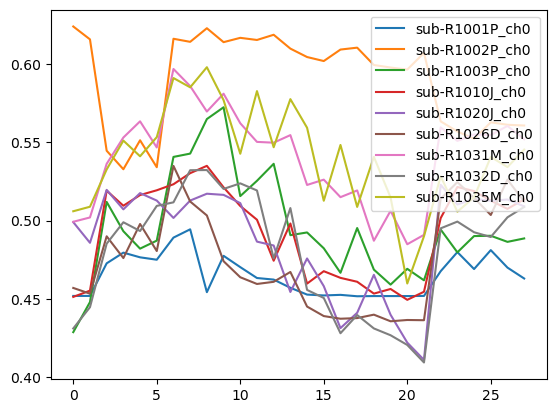

In [31]:
for i, sub_data in enumerate(eval["final"]["metrics"]):
    sub_name = eval["code"]["sub_chan"][i]
    plt.plot(sub_data[:,3])
plt.legend(list(eval["code"]["sub_chan"]))
plt.show()

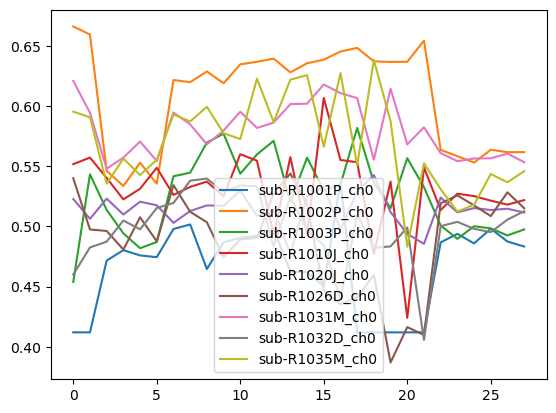

In [32]:
for i, sub_data in enumerate(eval["final"]["metrics"]):
    sub_name = eval["code"]["sub_chan"][i]
    plt.plot(sub_data[:,1])
plt.legend(list(eval["code"]["sub_chan"]))
plt.show()

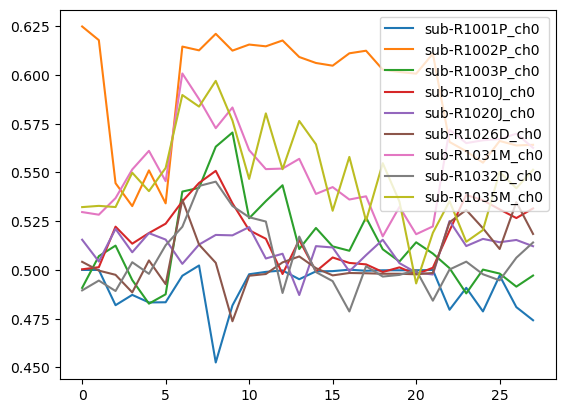

In [33]:
for i, sub_data in enumerate(eval["final"]["metrics"]):
    sub_name = eval["code"]["sub_chan"][i]
    plt.plot(sub_data[:,2])
plt.legend(list(eval["code"]["sub_chan"]))
plt.show()

In [14]:
eval["code"]["sub_chan"][0]

'sub-R1001P_ch0'

In [30]:
list(eval["code"]["metrics"])

['accuracy', 'precision', 'recall', 'f1', 'time']

In [15]:
eval["final"]["metrics"][0]

array([[8.2415020e-01, 4.1207510e-01, 5.0000000e-01, 4.5179954e-01,
        3.2900278e+02],
       [8.2415020e-01, 4.1207510e-01, 5.0000000e-01, 4.5179954e-01,
        3.2960855e+02],
       [7.4684757e-01, 4.7165343e-01, 4.8191810e-01, 4.7264701e-01,
        3.6803601e+02],
       [7.4849230e-01, 4.8031557e-01, 4.8720777e-01, 4.7949719e-01,
        4.1384354e+02],
       [7.4109101e-01, 4.7593680e-01, 4.8333061e-01, 4.7649452e-01,
        4.5885162e+02],
       [7.4629933e-01, 4.7449449e-01, 4.8342484e-01, 4.7495875e-01,
        4.4401126e+02],
       [6.3733554e-01, 4.9788514e-01, 4.9702328e-01, 4.8910046e-01,
        2.4330158e+01],
       [6.4501095e-01, 5.0165427e-01, 5.0229299e-01, 4.9440822e-01,
        4.5262917e+01],
       [6.2513709e-01, 4.6463794e-01, 4.5252907e-01, 4.5420778e-01,
        8.7207848e+01],
       [6.3294959e-01, 4.8687273e-01, 4.8179346e-01, 4.7745246e-01,
        1.2855495e+02],
       [8.0030155e-01, 4.9048397e-01, 4.9779367e-01, 4.7022235e-01,
        3.97

Рисую объединённый график: sub-R1001P | channel 5 | trials: 1


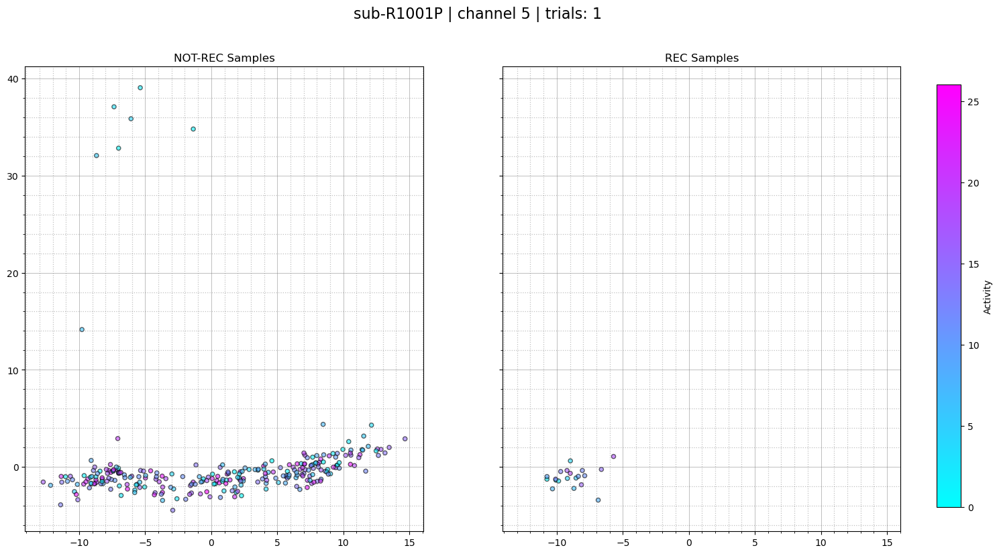

In [64]:
draw_projection_viewer("/trinity/home/asma.benachour/PDF/memory_class on 2025-04-04_00:04:37/PCA.zarr", label_loader_func=dummy_label_loader, pat='sub-R1001P', trial="trial_1", channel=5)


In [8]:
pca_projs = zarr.open_group("/trinity/home/asma.benachour/PDF/memory_class on 2025-04-04_00:04:37/PCA.zarr", mode='r')

In [15]:
pca_projs["sub-R1001P"]["trial_0"]["features"][:]

array([[[-1.7871619e+00,  3.5724354e+01,  0.0000000e+00],
        [-2.9942137e-01,  3.6270081e+01,  1.0000000e+00],
        [-2.9739094e+00,  3.7301208e+01,  2.0000000e+00],
        ...,
        [-9.5522041e+00, -5.6414986e-01,  1.7000000e+01],
        [-8.4139080e+00,  3.7672911e+00,  1.8000000e+01],
        [-8.1069975e+00,  1.6614771e+00,  1.9000000e+01]],

       [[ 5.1256251e-01,  3.4768188e+01,  0.0000000e+00],
        [-3.2727211e+00,  3.7863594e+01,  1.0000000e+00],
        [-3.0861199e+00,  3.9122196e+01,  2.0000000e+00],
        ...,
        [-8.0677433e+00, -3.4512711e-01,  1.7000000e+01],
        [-1.1595142e+01, -2.0341492e-01,  1.8000000e+01],
        [-8.3083534e+00,  7.2961044e-01,  1.9000000e+01]],

       [[-4.2699075e+00,  3.4108536e+01,  0.0000000e+00],
        [-5.4083405e+00,  3.7458248e+01,  1.0000000e+00],
        [-1.7103683e+00,  3.8098877e+01,  2.0000000e+00],
        ...,
        [-9.4126606e+00, -1.3752556e-01,  1.7000000e+01],
        [-1.0358610e+01,  7.1

Рисую объединённый график: sub-R1002P | channel 40 | trials: 25


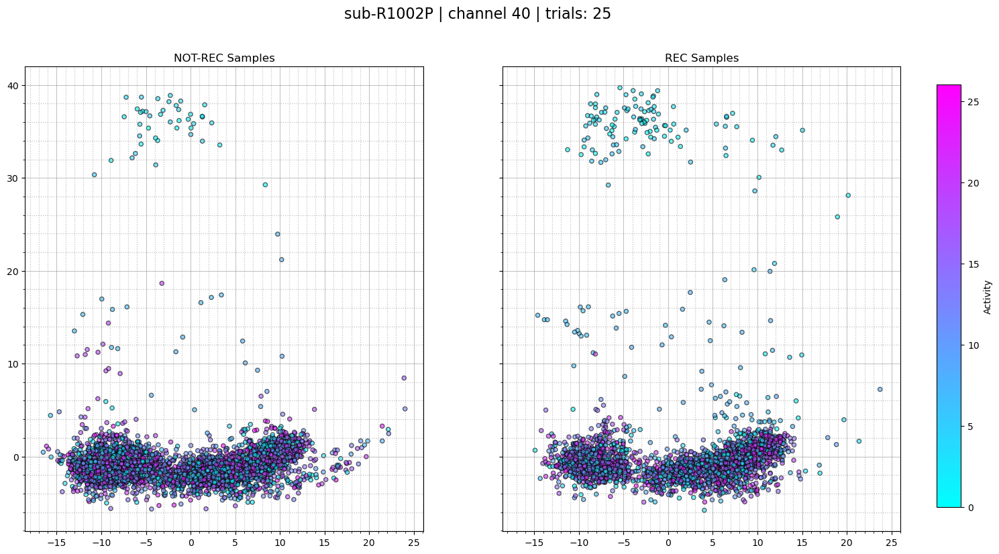

Рисую объединённый график: sub-R1002P | channel 41 | trials: 25


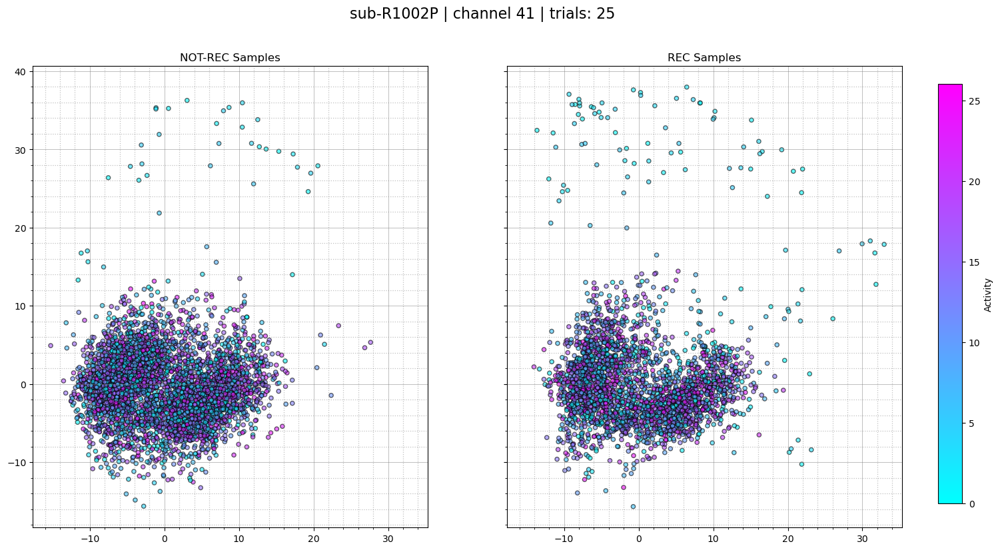

Рисую объединённый график: sub-R1002P | channel 42 | trials: 25


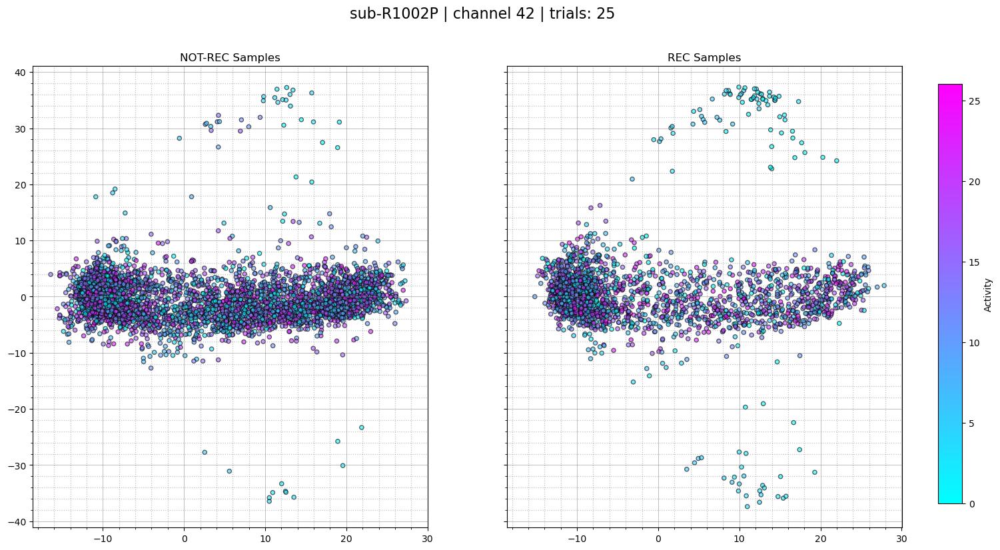

Рисую объединённый график: sub-R1002P | channel 43 | trials: 25


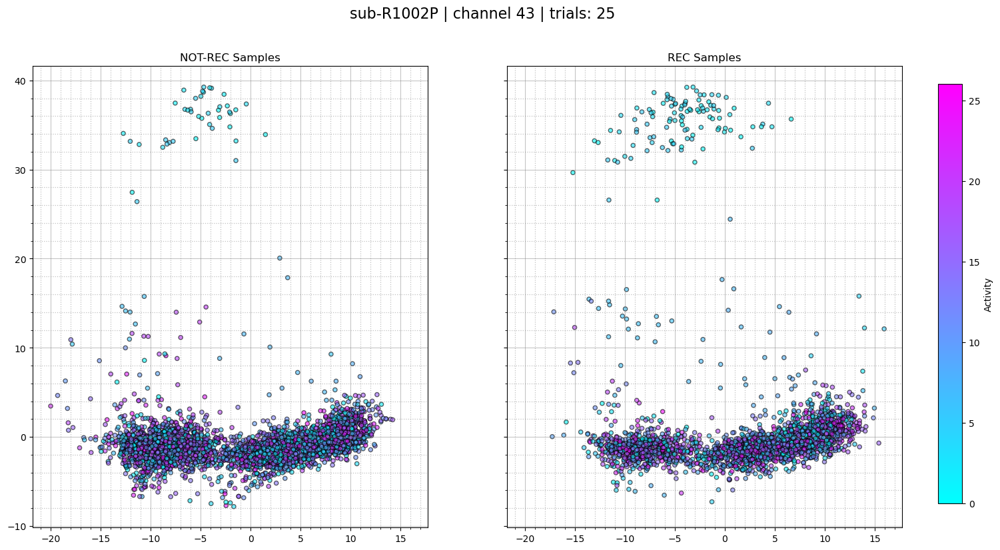

Рисую объединённый график: sub-R1002P | channel 44 | trials: 25


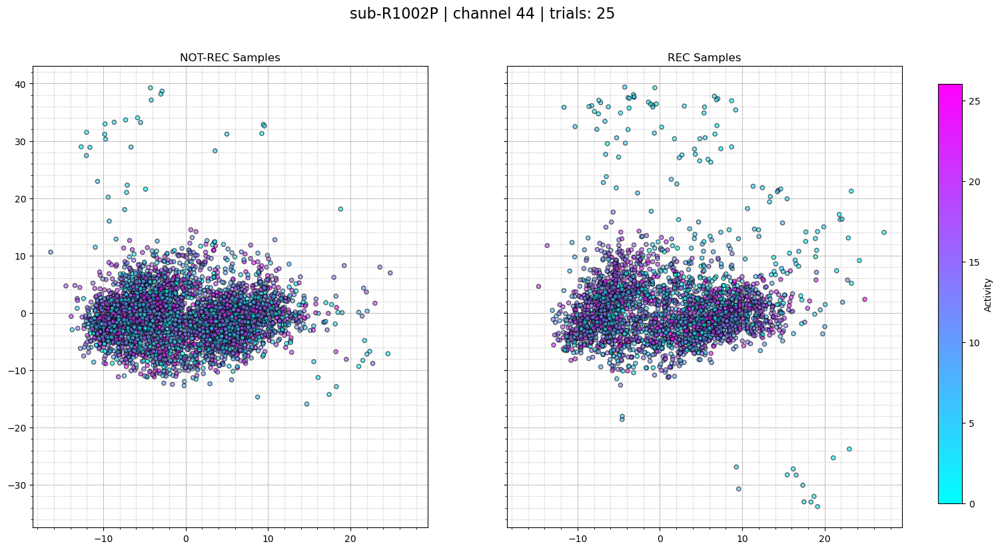

Рисую объединённый график: sub-R1002P | channel 45 | trials: 25


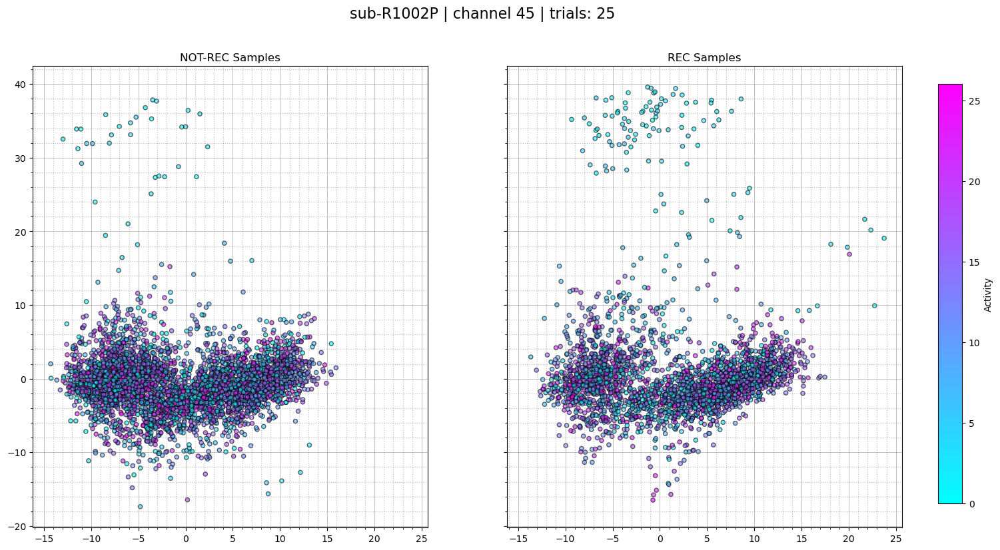

Рисую объединённый график: sub-R1002P | channel 46 | trials: 25


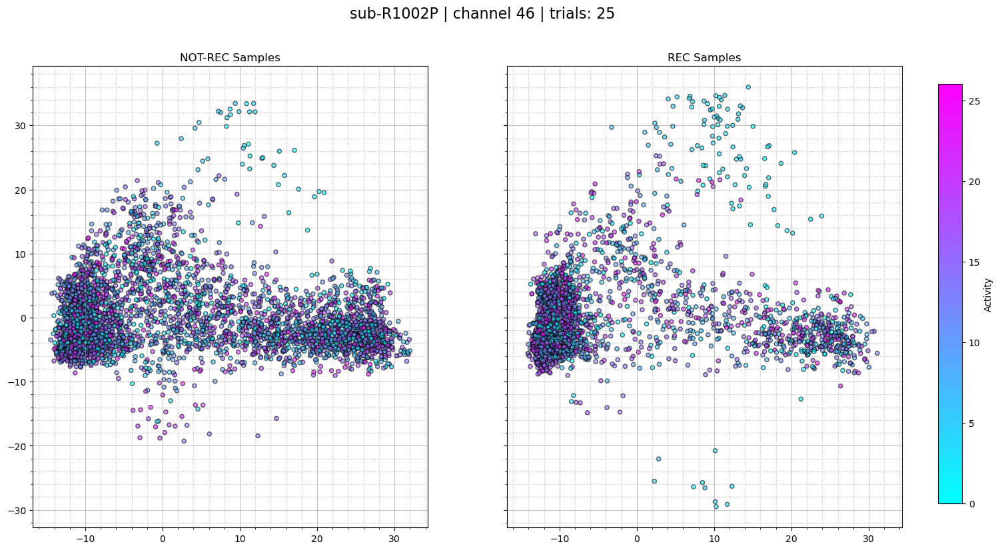

Рисую объединённый график: sub-R1002P | channel 47 | trials: 25


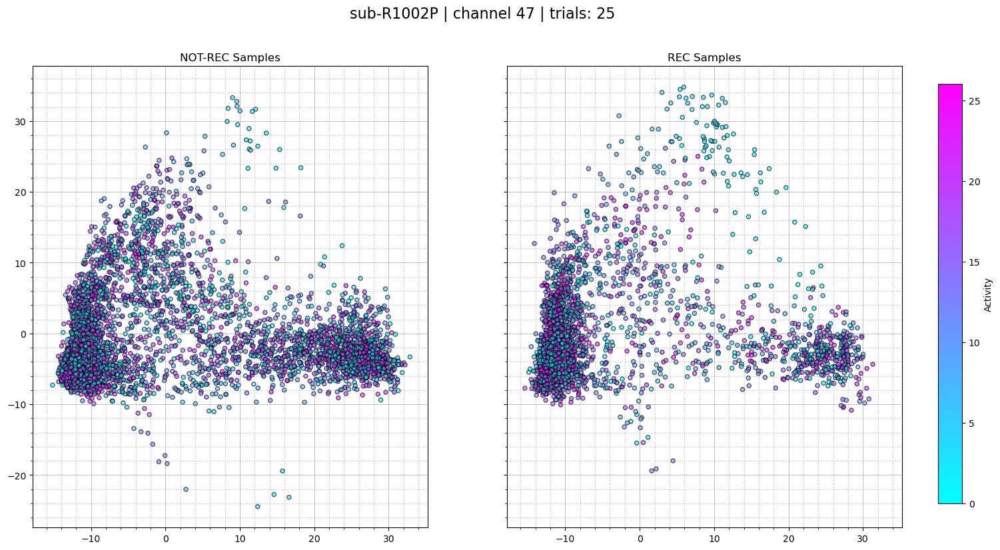

Рисую объединённый график: sub-R1002P | channel 48 | trials: 25


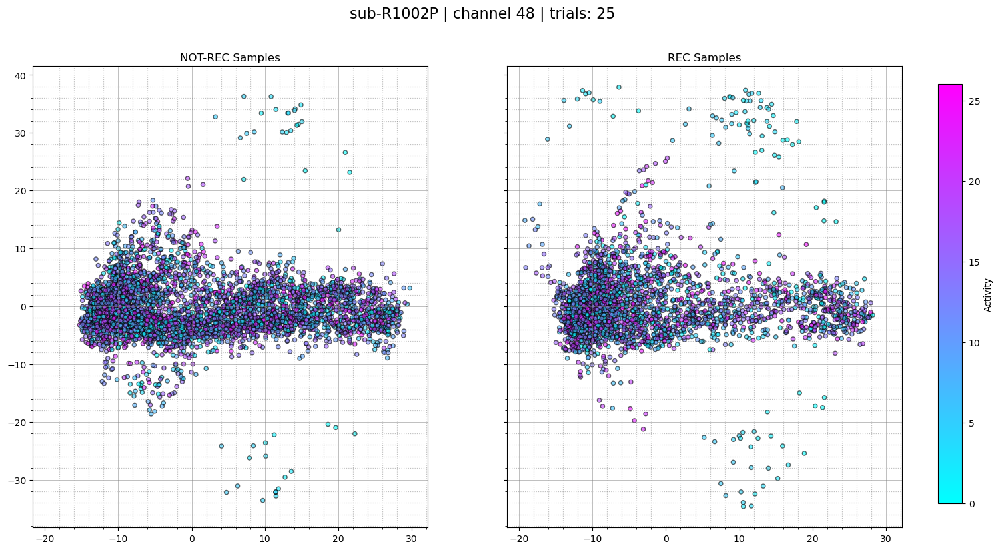

Рисую объединённый график: sub-R1002P | channel 49 | trials: 25


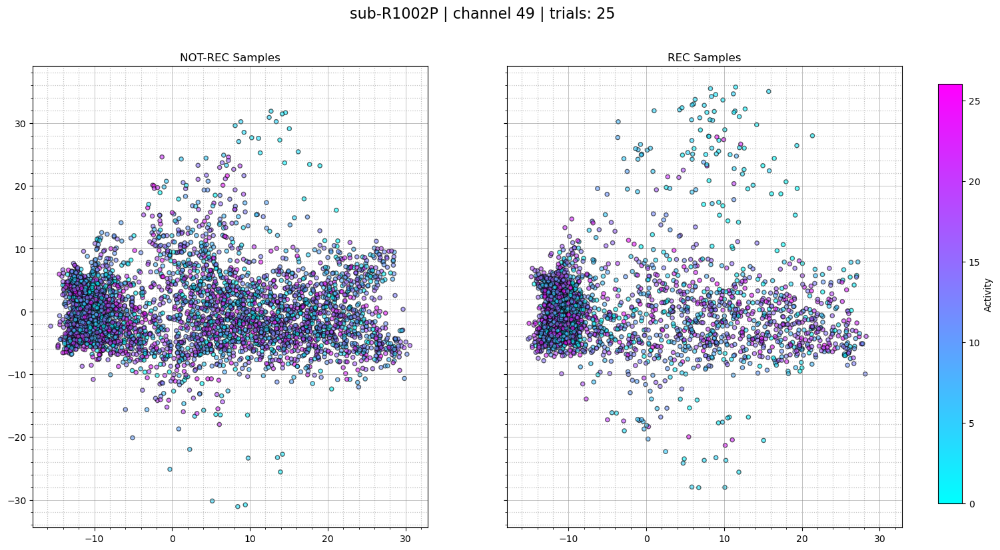

Рисую объединённый график: sub-R1002P | channel 50 | trials: 25


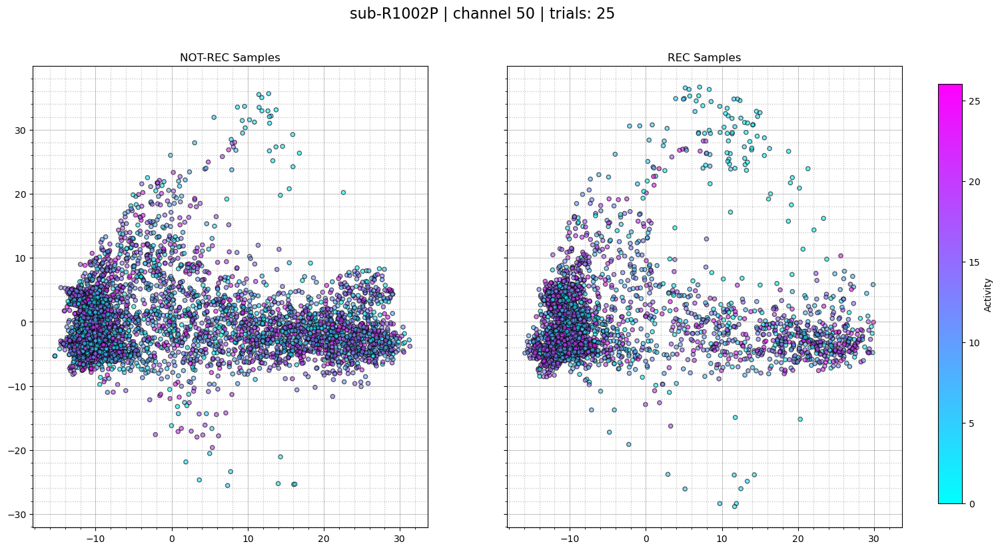

Рисую объединённый график: sub-R1002P | channel 51 | trials: 25


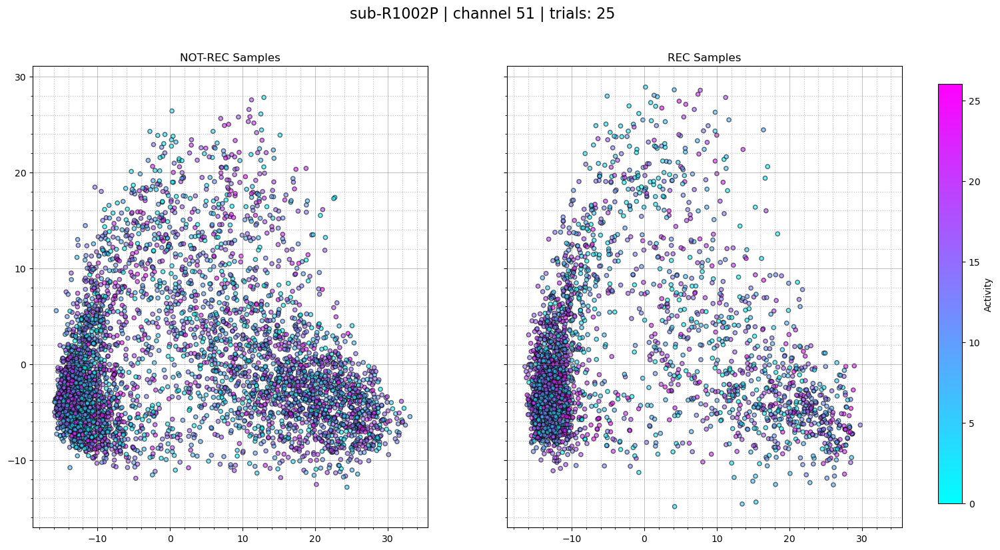

Рисую объединённый график: sub-R1002P | channel 52 | trials: 25


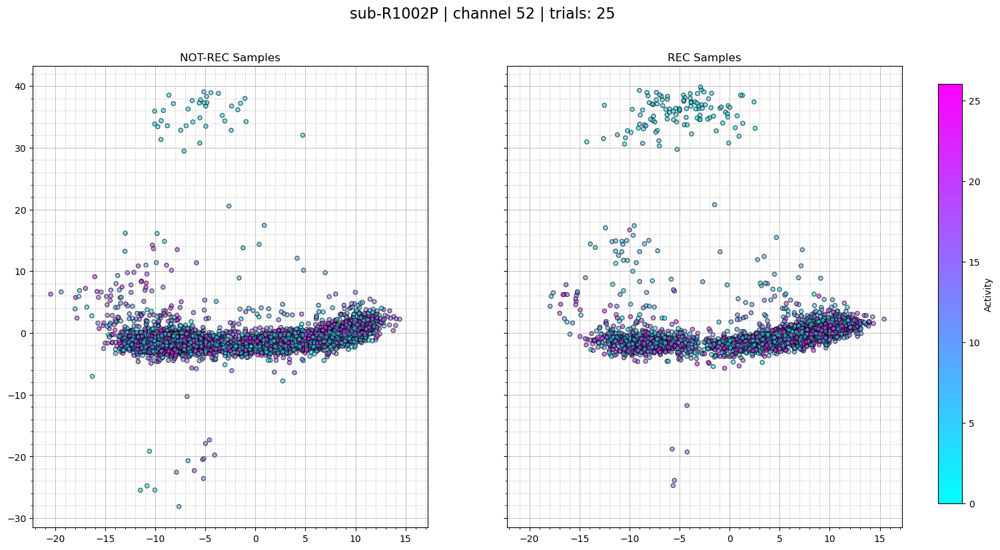

Рисую объединённый график: sub-R1002P | channel 53 | trials: 25


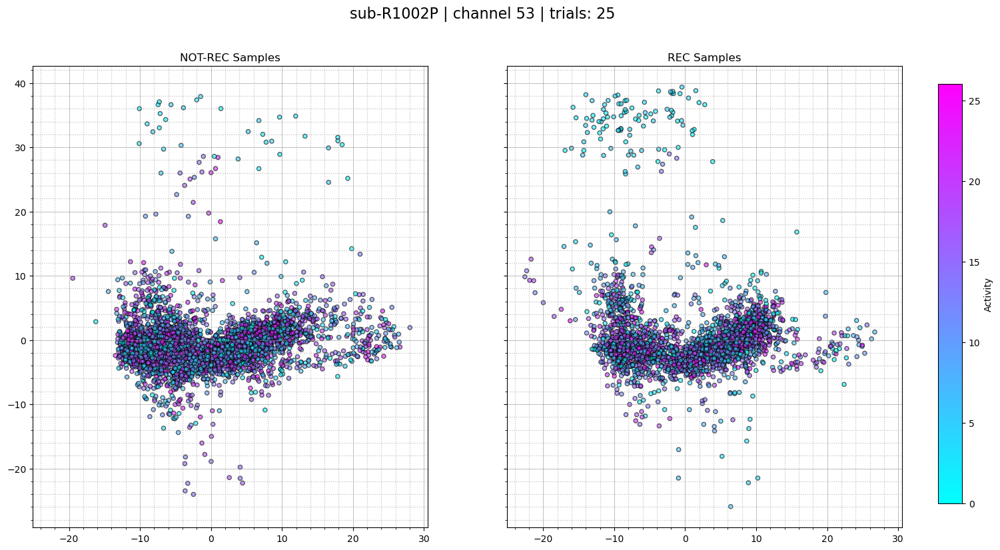

Рисую объединённый график: sub-R1002P | channel 54 | trials: 25


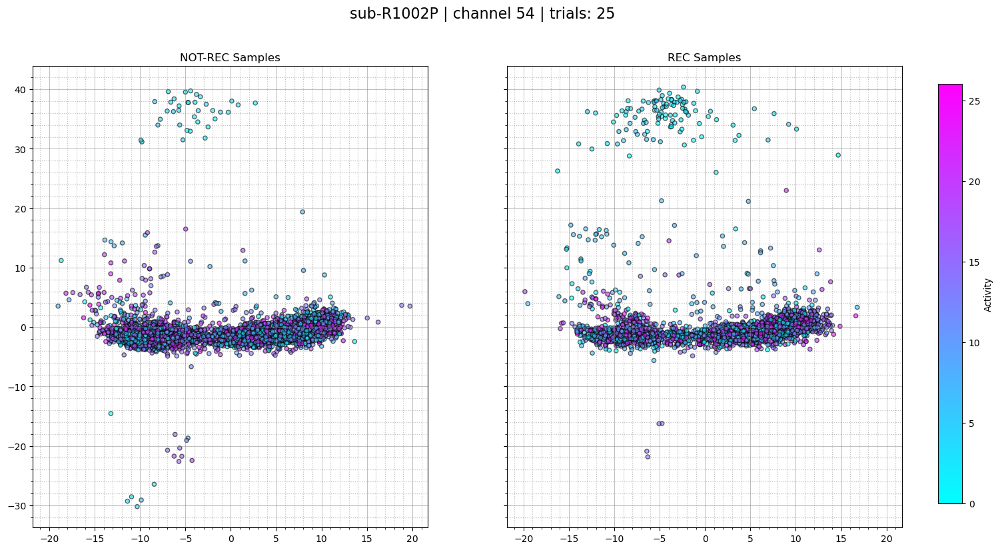

Рисую объединённый график: sub-R1002P | channel 55 | trials: 25


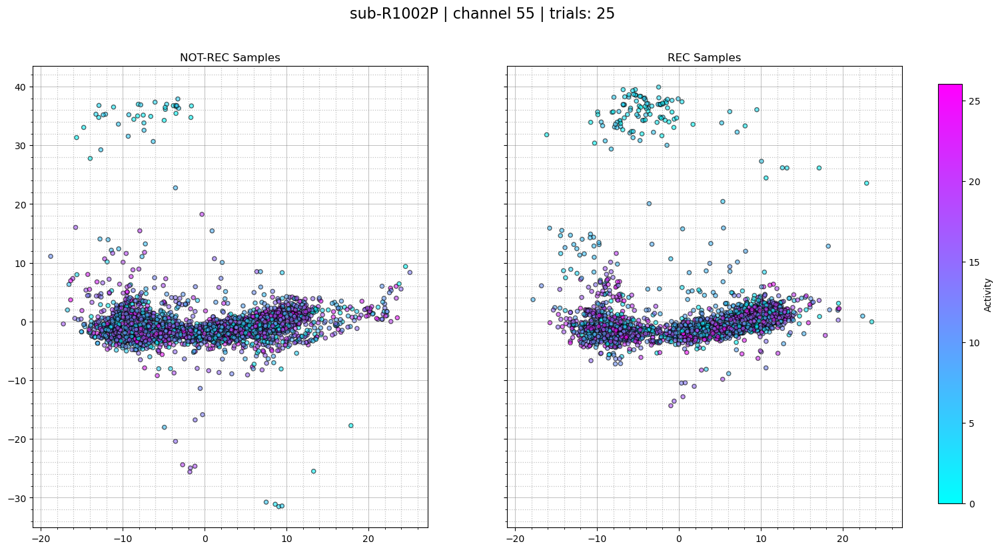

Рисую объединённый график: sub-R1002P | channel 56 | trials: 25


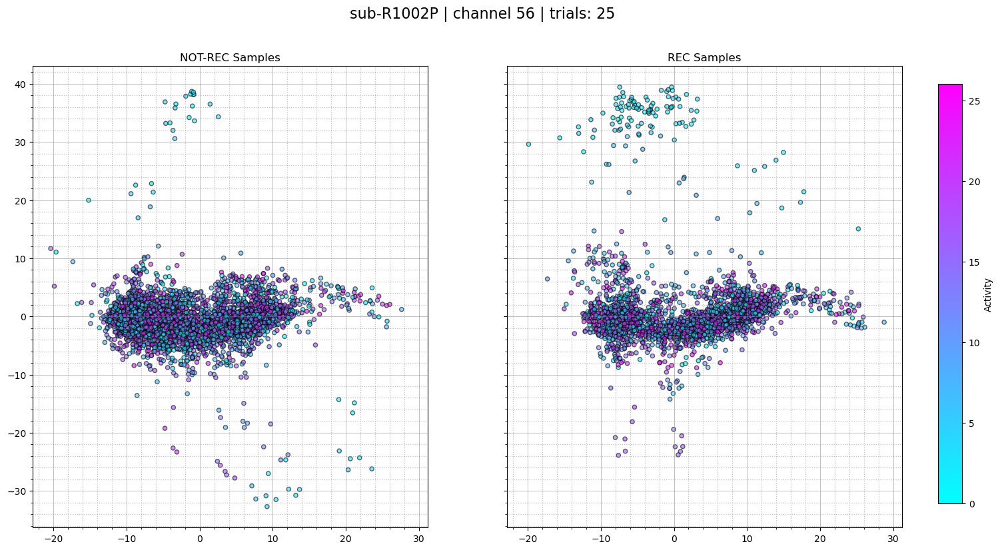

Рисую объединённый график: sub-R1002P | channel 57 | trials: 25


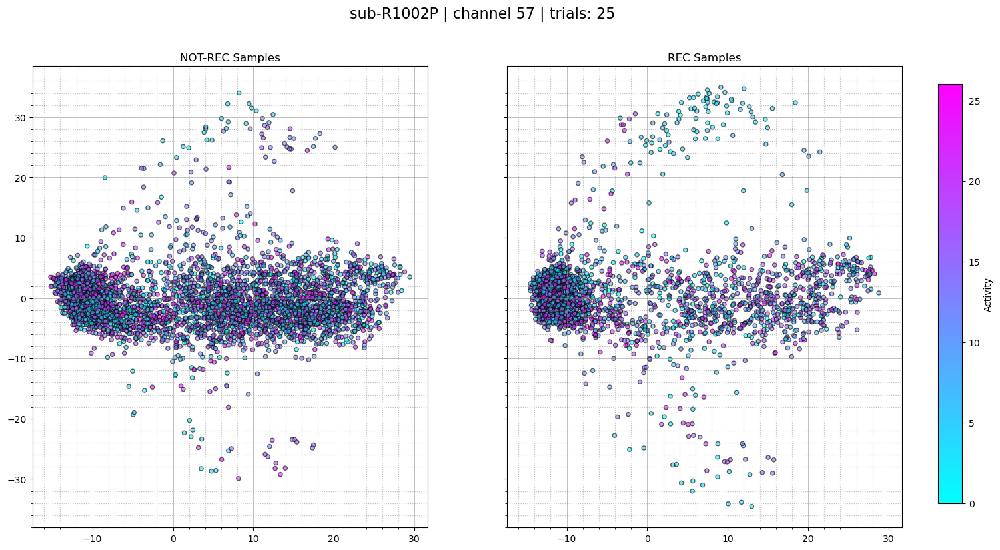

BoundsCheckError: index out of bounds for dimension with length 58

In [40]:
subs = [
    "sub-R1001P",
    "sub-R1002P",
    "sub-R1003P",
    "sub-R1010J",
    # "sub-R1015J", 4 trials - too small experiment itself
    "sub-R1020J",
    "sub-R1026D",
    "sub-R1031M",
    "sub-R1032D",
    "sub-R1035M",
    ]
sub=subs[1]
for ch in range(40,60):
    draw_projection_viewer("/trinity/home/asma.benachour/PDF/memory_class on 2025-04-04_00:04:37/PCA.zarr", label_loader_func=dummy_label_loader, pat=sub, channel=ch)
